# Datathon #4

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import warnings
import io
from google.colab import files

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import KFold, train_test_split, GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.metrics import mean_squared_error, classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from sklearn.model_selection import StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.metrics import RocCurveDisplay, auc

from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline

import time

warnings.filterwarnings('ignore')


In [2]:
# Choose the dataset to upload
uploaded = files.upload()

Saving datathon4.csv to datathon4.csv


In [3]:
# Read the dataset into a Pandas DataFrame
df = pd.read_csv(io.BytesIO(uploaded['datathon4.csv']))
#df = pd.read_csv('datathon4.csv')

# Inspect the first five rows of the data
df.head()


,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [4]:
# Upload the dictionary
uploaded2 = files.upload()

Saving datathon4-dictionary.csv to datathon4-dictionary.csv


In [5]:
# Read the dataset into a Pandas DataFrame
df_dict = pd.read_csv(io.BytesIO(uploaded2['datathon4-dictionary.csv']))
#df_dict = pd.read_csv('datathon4-dictionary.csv')

In [ ]:
df_dict['Category'].unique()

array(['identifier', 'demographic', 'APACHE covariate', 'vitals', 'labs',
       'labs blood gas', 'APACHE prediction', 'APACHE comorbidity',
       'APACHE grouping', 'GOSSIS example prediction'], dtype=object)

In [6]:
id_columns=list(df_dict[df_dict['Category']=='identifier']['Variable Name']) #drop from model 1 and 2
id_columns.append('icu_id') # Also an identifier variable, not relevant to question

APACHE_grouping_columns=list(df_dict[df_dict['Category']=='APACHE grouping']['Variable Name']) #drop from model 1
vital_columns=list(df_dict[df_dict['Category']=='vitals']['Variable Name']) #drop from model 1
labs_columns=list(df_dict[df_dict['Category']=='labs']['Variable Name']) #drop from model 1
labs_blood_gas_columns=list(df_dict[df_dict['Category']=='labs blood gas']['Variable Name']) #drop from model 1
apache_pred_columns=list(df_dict[df_dict['Category']=='APACHE prediction']['Variable Name']) # to drop from both models

In [7]:
# Drop IDENTIFIER columns
df = df.drop(id_columns, axis=1)
df.head()

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,admit,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,admit,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.95,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,admit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.64,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,admit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,0,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,admit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [ ]:
df.describe(include='all')

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_stay_type,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
count,91713.000000,87485.000000,88284.000000,91713.000000,90318,91688,90379.000000,70304,91601,91713,...,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90051,90051
unique,NaN,NaN,NaN,NaN,6,2,NaN,15,5,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,10
top,NaN,NaN,NaN,NaN,Caucasian,M,NaN,Emergency Department,Accident & Emergency,admit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cardiovascular,Cardiovascular
freq,NaN,NaN,NaN,NaN,70684,49469,NaN,36962,54060,86183,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29999,38816
mean,0.086302,62.309516,29.185818,0.183736,NaN,NaN,169.641588,NaN,NaN,NaN,...,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638,NaN,NaN
std,0.280811,16.775119,8.275142,0.387271,NaN,NaN,10.795378,NaN,NaN,NaN,...,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169,NaN,NaN
min,0.000000,16.000000,14.844926,0.000000,NaN,NaN,137.200000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,0.000000,52.000000,23.641975,0.000000,NaN,NaN,162.500000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
50%,0.000000,65.000000,27.654655,0.000000,NaN,NaN,170.100000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
75%,0.000000,75.000000,32.930206,0.000000,NaN,NaN,177.800000,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN


# Missing data

In [8]:
def get_missing_data(data):
  """
  Returns DataFrame with percent missing data from input data (DataFrame).

  Parameters
  -----
  data (DataFrame): input dataframe

  Returns
  -----
  missing_data (DataFrame): output dataframe with % missing values
  """
  print(data.isnull().sum())

  # Get percentage of missing values in each column
  missing_data_prop={}
  for x,y in enumerate(list(data.isnull().sum())):
    missing_data_prop[data.columns[x]]=(float(y/data.shape[0])*100) #"{:.2f}".format

  missing_data=pd.DataFrame(missing_data_prop.items(), columns=['column', 'percent_missing'])
  return missing_data

get_missing_data(df)

hospital_death                    0
age                            4228
bmi                            3429
elective_surgery                  0
ethnicity                      1395
                               ... 
leukemia                        715
lymphoma                        715
solid_tumor_with_metastasis     715
apache_3j_bodysystem           1662
apache_2_bodysystem            1662
Length: 182, dtype: int64


,column,percent_missing
0,hospital_death,0.000000
1,age,4.610033
2,bmi,3.738837
3,elective_surgery,0.000000
4,ethnicity,1.521049
...,...,...
177,leukemia,0.779606
178,lymphoma,0.779606
179,solid_tumor_with_metastasis,0.779606
180,apache_3j_bodysystem,1.812175


In [10]:
missing_data=get_missing_data(df)
cols_to_drop=list(missing_data[missing_data['percent_missing']>70]['column'])
print(f'{len(cols_to_drop)} columns to drop due to over 70% missing')
cols_to_drop #over 70% missing

hospital_death                    0
age                            4228
bmi                            3429
elective_surgery                  0
ethnicity                      1395
                               ... 
leukemia                        715
lymphoma                        715
solid_tumor_with_metastasis     715
apache_3j_bodysystem           1662
apache_2_bodysystem            1662
Length: 182, dtype: int64
55 columns to drop due to over 70% missing


['fio2_apache',
 'paco2_apache',
 'paco2_for_ph_apache',
 'pao2_apache',
 'ph_apache',
 'd1_diasbp_invasive_max',
 'd1_diasbp_invasive_min',
 'd1_mbp_invasive_max',
 'd1_mbp_invasive_min',
 'd1_sysbp_invasive_max',
 'd1_sysbp_invasive_min',
 'h1_diasbp_invasive_max',
 'h1_diasbp_invasive_min',
 'h1_mbp_invasive_max',
 'h1_mbp_invasive_min',
 'h1_sysbp_invasive_max',
 'h1_sysbp_invasive_min',
 'd1_lactate_max',
 'd1_lactate_min',
 'h1_albumin_max',
 'h1_albumin_min',
 'h1_bilirubin_max',
 'h1_bilirubin_min',
 'h1_bun_max',
 'h1_bun_min',
 'h1_calcium_max',
 'h1_calcium_min',
 'h1_creatinine_max',
 'h1_creatinine_min',
 'h1_hco3_max',
 'h1_hco3_min',
 'h1_hemaglobin_max',
 'h1_hemaglobin_min',
 'h1_hematocrit_max',
 'h1_hematocrit_min',
 'h1_lactate_max',
 'h1_lactate_min',
 'h1_platelets_max',
 'h1_platelets_min',
 'h1_potassium_max',
 'h1_potassium_min',
 'h1_sodium_max',
 'h1_sodium_min',
 'h1_wbc_max',
 'h1_wbc_min',
 'd1_pao2fio2ratio_max',
 'd1_pao2fio2ratio_min',
 'h1_arterial_pco

<Axes: >

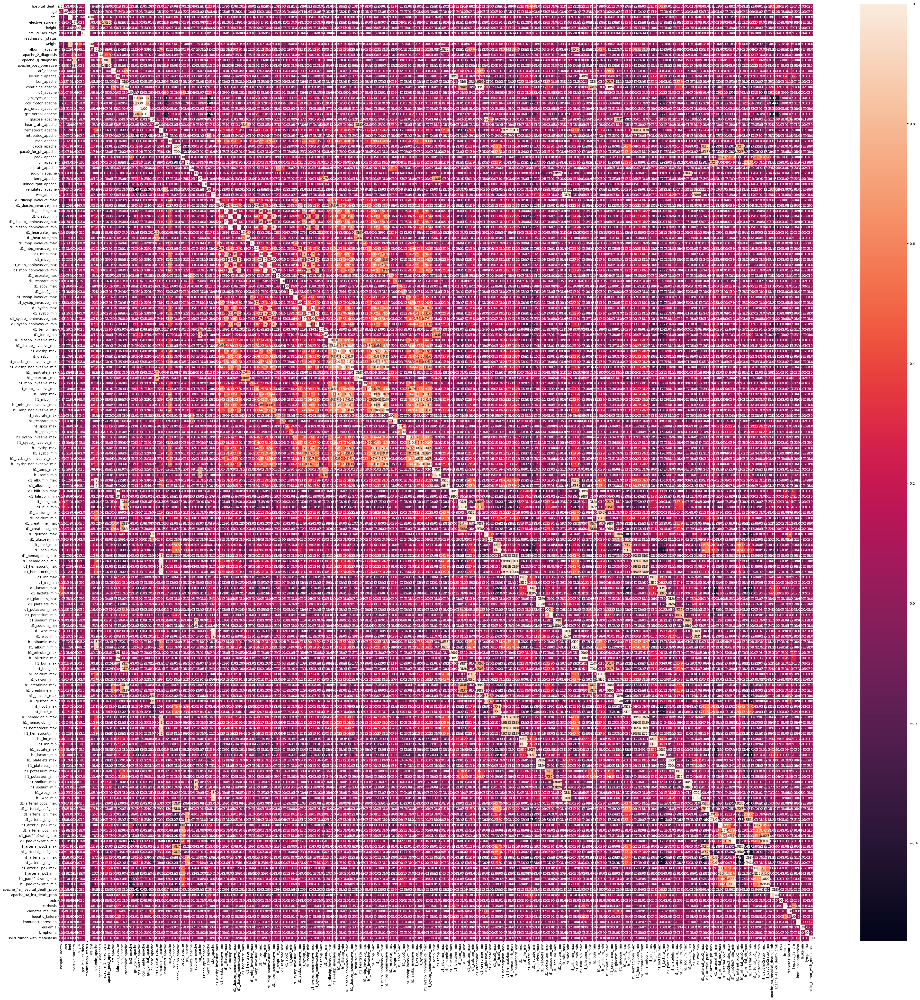

In [ ]:
fig, ax = plt.subplots(figsize=(50,50))         # Sample figsize in inches
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f",linewidths=.5, ax=ax)

Demographics

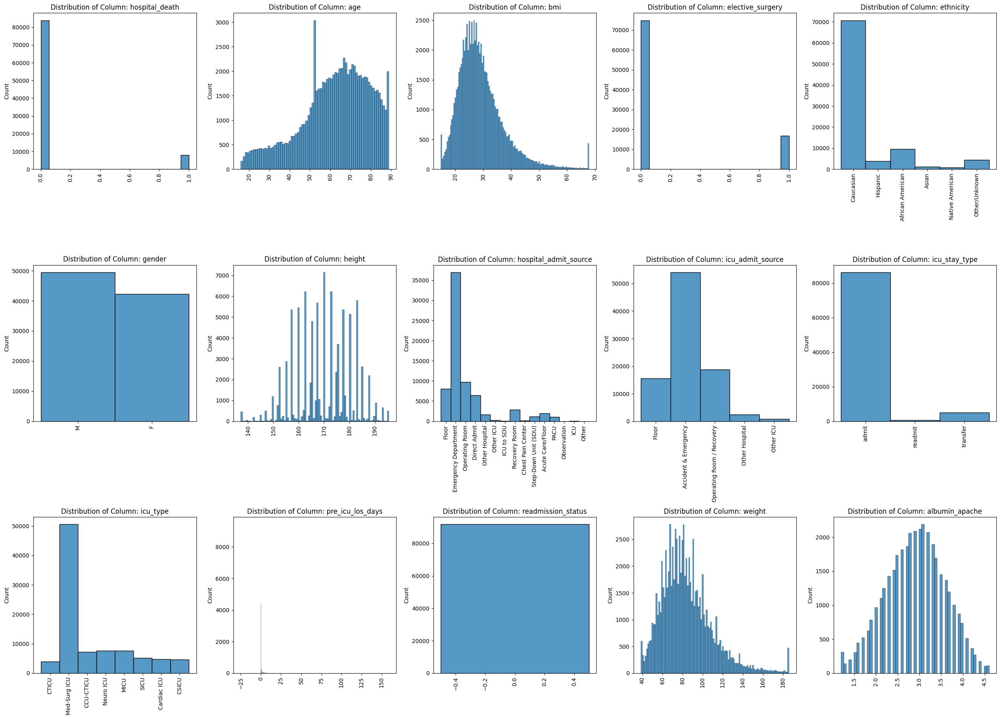

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 18), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[0:15]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

There is an imbalance in the outcome variable, may need to do resampling


APACHE covariate

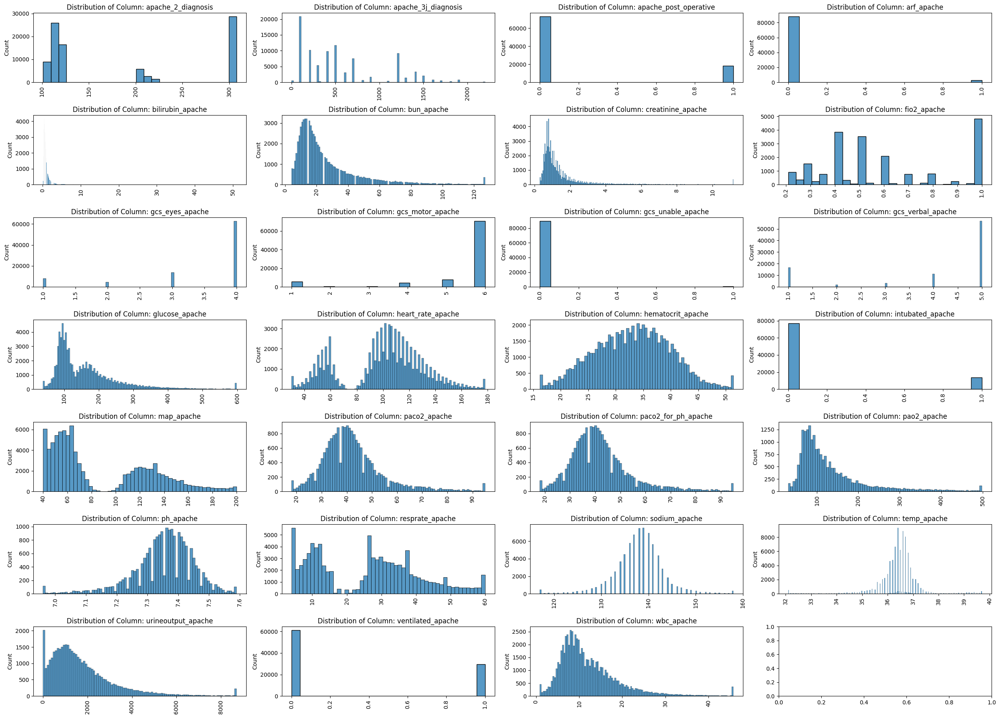

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=7, ncols=4, figsize=(25, 18), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[16:43]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

Vitals

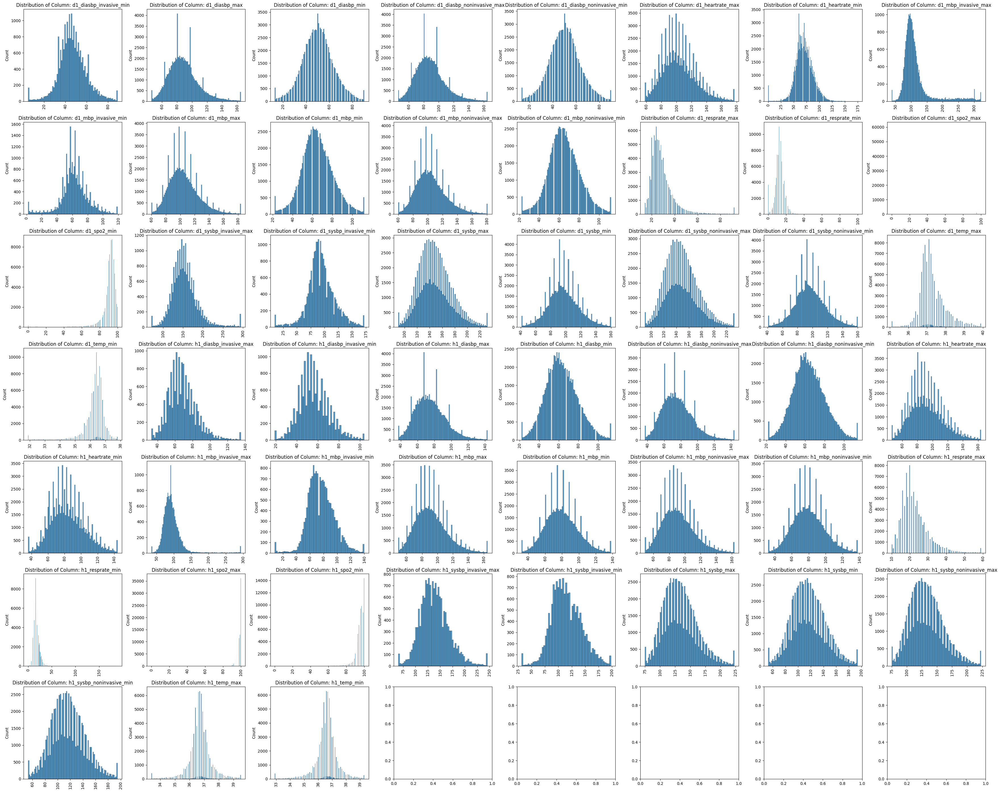

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=7, ncols=8, figsize=(35, 28), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[44:95]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

Labs

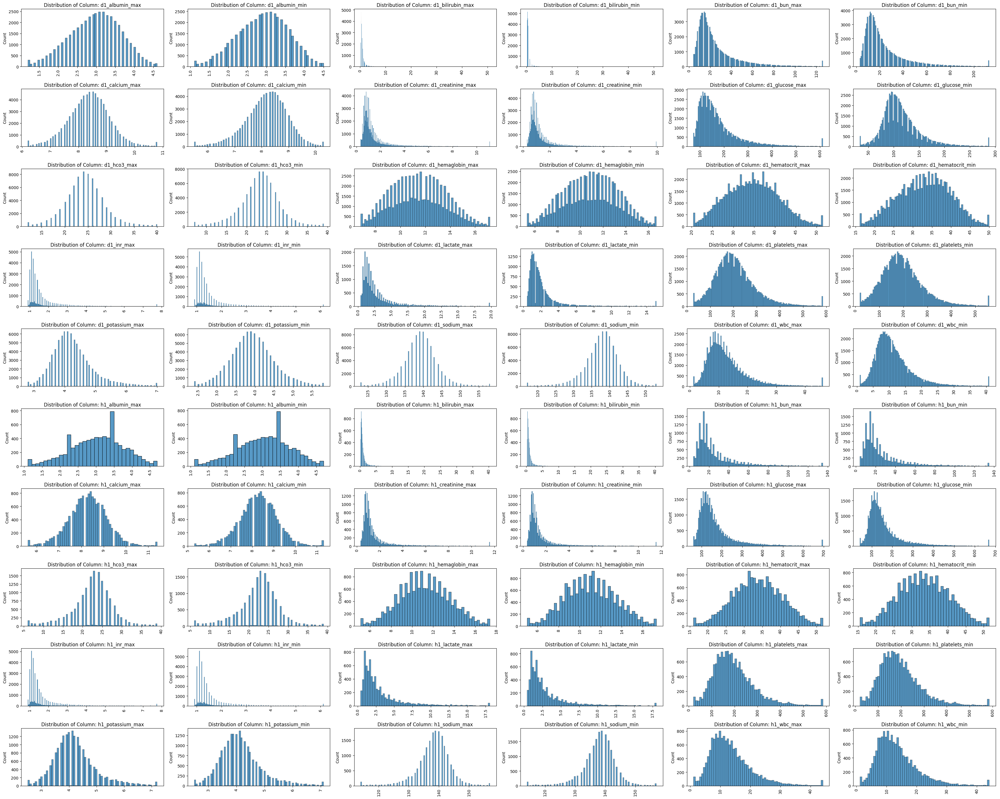

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=10, ncols=6, figsize=(35, 28), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[95:155]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

Labs blood gas

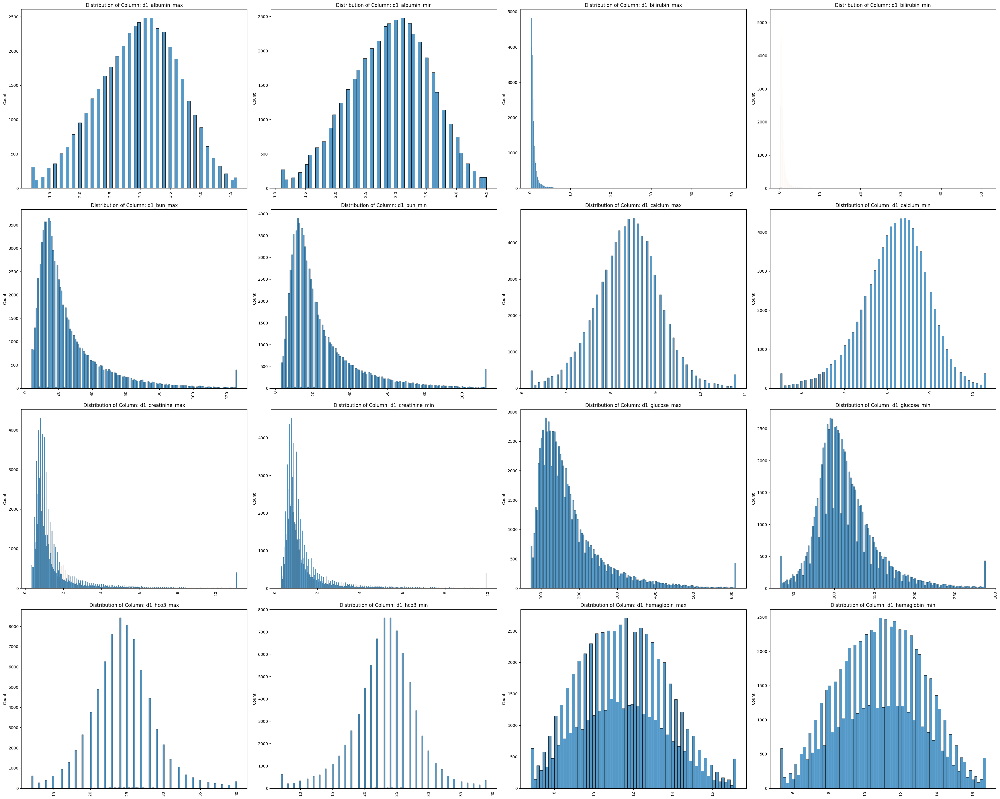

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(35, 28), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[95:171]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

APACHE prediction and APACHE comorbidity

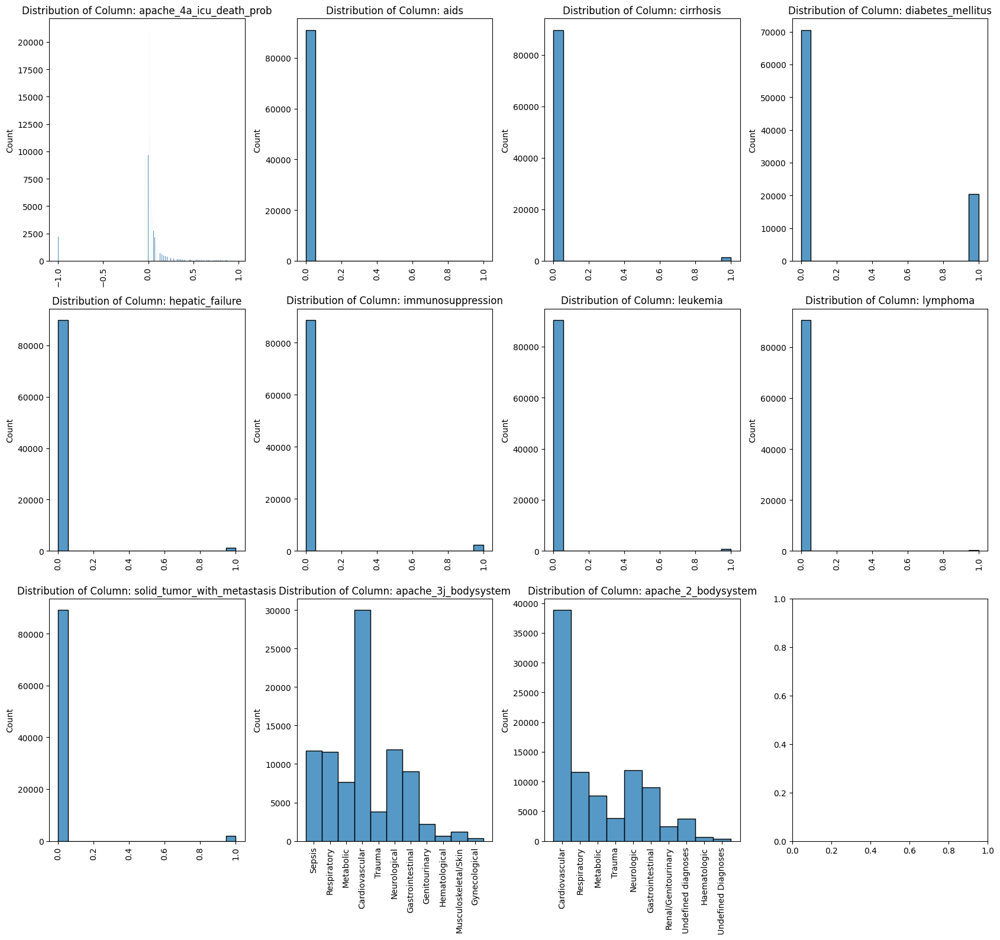

In [ ]:
#Batch process as running this loop on entire dataset causes system to crash

fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(17,16), sharex=False, sharey=False)
axes = axes.ravel()
cols = df.columns[172:]

for col, ax in zip(cols, axes):
    sns.histplot(data=df, x=col, fill=True, ax=ax)
    ax.tick_params(axis='x', rotation=90)
    ax.set(title=f'Distribution of Column: {col}', xlabel=None)

#fig.delaxes(axes[5])  # delete the empty subplot
fig.tight_layout()
plt.show()

In [ ]:
df.columns

Index(['hospital_death', 'age', 'bmi', 'elective_surgery', 'ethnicity',
       'gender', 'height', 'hospital_admit_source', 'icu_admit_source',
       'icu_id',
       ...
       'aids', 'cirrhosis', 'diabetes_mellitus', 'hepatic_failure',
       'immunosuppression', 'leukemia', 'lymphoma',
       'solid_tumor_with_metastasis', 'apache_3j_bodysystem',
       'apache_2_bodysystem'],
      dtype='object', length=183)

# Building models

In [11]:
# Full model - Model 1
# Drop variables related to labs/blood
df_model1 = df.drop(APACHE_grouping_columns, axis=1)
df_model1 = df_model1.drop(vital_columns, axis=1)
df_model1 = df_model1.drop(labs_columns, axis=1)
df_model1 = df_model1.drop(labs_blood_gas_columns, axis=1)
df_model1 = df_model1.drop(apache_pred_columns, axis=1)

## Filter out columns that are in cols_to_drop and are present in df_model1
cols_to_drop_existing = [col for col in cols_to_drop if col in df_model1.columns]
# Drop the selected columns from df_model1
df_model1_alt = df_model1.drop(cols_to_drop_existing, axis=1)

In [12]:
# Add in variables related to labs/blood - Model 2
df_model2 = df.drop(APACHE_grouping_columns, axis=1)
df_model2 = df_model2.drop(apache_pred_columns, axis=1)

## Filter out columns that are in cols_to_drop and are present in df_model2
cols_to_drop_existing = [col for col in cols_to_drop if col in df_model2.columns]
# Drop the selected columns from df_model2
df_model2_alt = df_model2.drop(cols_to_drop_existing, axis=1)

<Axes: >

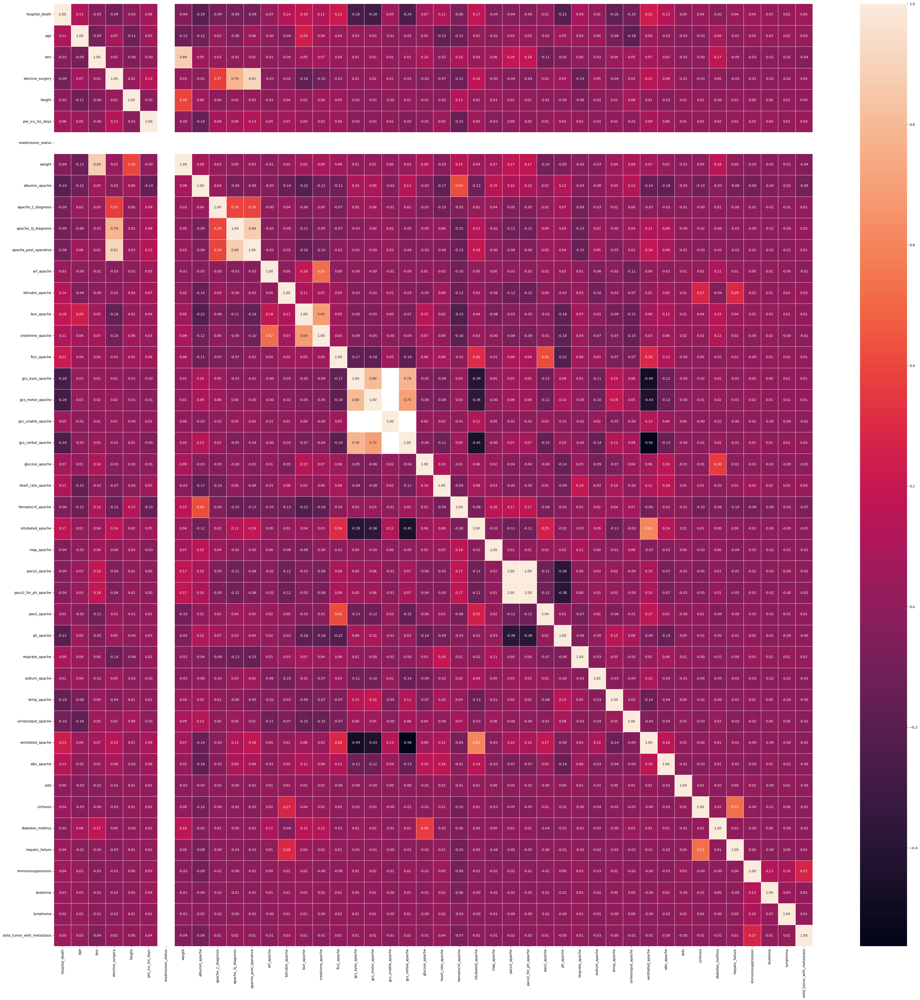

In [ ]:
fig, ax = plt.subplots(figsize=(50,50))         # Sample figsize in inches
corr_matrix = df_model1.corr()
sns.heatmap(corr_matrix, annot=True, fmt=".2f",linewidths=.5, ax=ax)

# Important functions to run

In [13]:
# Define a function to compute various scores for model evaluation
def get_scores(Y_pred, Y):
    """
    Unifies similar disease categories based on International Classification of Functioning, Disability and Health (ICF)
    classification framework.

      Parameters
      ----------
      Y_pred (array): list of predictive values.
      Y (array): list of ground truth values.

      Returns
      -------
      conf_matrix (Matrix): confusion matrix for model predictions vs actual.
      class_report (dict): class report for model predictions vs actual.
      auc (float): AUC value for model prediction.

    """
    # Calculate confusion matrix, classification report, ROC AUC
    conf_matrix = confusion_matrix(Y_pred, Y)
    class_report = classification_report(Y_pred, Y, output_dict=True)
    auc = roc_auc_score(Y_pred, Y)

    # Return the computed scores
    return conf_matrix, class_report, auc

# Define a function to print the computed scores
def print_scores(conf_matrix, class_report, auc):
    """
    Prints scores.

      Parameters
      ----------
      conf_matrix (Matrix): confusion matrix for model predictions vs actual.
      class_report (string): class report for model predictions vs actual.
      auc (float):AUC value for model prediction.

      Returns
      -------
      None

    """
    print('AUC : ', auc)
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

In [14]:
def get_categorical_cols(df):
  """
  Returns categorical column names.

  Parameters
  ----------
  df (DataFrame): DataFrame with feature columns.

  Returns
  -------
  List of categorical columns.

  """

  # For one hot encoding
  cats = ([col for col in df.columns if
           (df[col].dtype=='object')])
  return cats

In [15]:
def get_numerical_cols(df):
  """
  Returns numerical column names.

  Parameters
  ----------
  df (DataFrame): DataFrame with feature columns.

  Returns
  -------
  List of numerical columns.

  """
  # Don't include ordinal variables
  cols_remove = ['aids','cirrhosis','diabetes_mellitus','hepatic_failure','immunosuppression',
                 'leukemia','lymphoma','solid_tumor_with_metastasis','gcs_unable_apache',
                 'gcs_eyes_apache','gcs_motor_apache','gcs_unable_apache','gcs_verbal_apache']
  return ([col for col in df.columns if df[col].dtype=='float' and col not in cols_remove])

In [16]:
def get_list_indices(df,categorical_columns,numerical_columns):
  """
  Returns categorical and numerical column indices.

  Parameters
  ----------
  df (DataFrame): DataFrame with feature columns.
  categorical_columns (DataFrame): DataFrame with categorical columns
  numerical_columns (DataFrame): DataFrame with numerical columns

  Returns
  -------
  cat_index_list (List): list of categorical indices.
  num_index_list (List): list of numerical indices.

  """
  cat_index_list=[]
  num_index_list=[]
  for index,col in enumerate(df.columns):
    if col in categorical_columns:
      cat_index_list.append(index)
    elif col in numerical_columns:
      num_index_list.append(index)

  return cat_index_list, num_index_list

# Building pipelines

In [18]:
def build_pipeline(X_train, y_train, cat_indices, num_indices, model, param_grid, sample='no_smote'):
  """
  Builds pipeline and performs cross-validation on the training set.

  Parameters
  ----------
  X_train (array): training set, predictor variables.
  y_train (array): training set, outcome variable.
  cat_indices (List): list of categorical indices.
  num_indices (List): list of numerical indices.
  sample (String): to determine whether re-sampling should be applied.

  Returns
  -------
  train_results (DataFrame): evaluation metrics for cross-validation on training set.
  validation_results (DataFrame): evaluation metrics for cross-validation on validation set.

  """

  # Metrics lists for class 0
  precision_list = {'train':[],'validation':[]}
  recall_list = {'train':[],'validation':[]}
  f1_list = {'train':[],'validation':[]}

  # Metrics lists for class 1
  precision_list_alt = {'train':[],'validation':[]}
  recall_list_alt = {'train':[],'validation':[]}
  f1_list_alt = {'train':[],'validation':[]}

  auc_list = {'train':[],'validation':[]}

  st = time.time()

  # Set up StratifiedKFold for cross validation
  skf = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

  # Create separate pipelines for different data types: numeric and categorical
  categorical_transformer = Pipeline(
      steps=[("imputer", SimpleImputer(strategy="most_frequent")),
          ("encoder", OneHotEncoder(sparse=False,handle_unknown="error")), #handle_unknown="unknown"
          ("scaler", StandardScaler())]#with_mean=False
  )

  numeric_transformer = Pipeline(
      steps=[("imputer", SimpleImputer(strategy="median")),
      ("scaler", StandardScaler())]
  )

  preprocessor = ColumnTransformer(
      transformers=[
          ("cat", categorical_transformer, cat_indices),
          ("num", numeric_transformer, num_indices)
      ]
  )

  # RandomizedSearchCV takes much less time than GridSearchCV
  rand_log_reg = RandomizedSearchCV(model, param_grid, n_iter=5)

  # Start cross-validation
  for train, val in skf.split(X_train, y_train):

      # Make pipeline with or without oversampling
      if sample=='smote':
        pipeline = make_pipeline(preprocessor,
                         SMOTE(sampling_strategy='minority'),
                         rand_log_reg)

      else:
         pipeline = make_pipeline(preprocessor, #no SMOTE = default
                         rand_log_reg)

      ### Fit on training set ###
      model = pipeline.fit(X_train[train], y_train[train])
      y_pred_train = model.predict(X_train[train])

      # Get the best estimator
      log_reg_sm = rand_log_reg.best_estimator_

      # Metrics for training set
      conf_matrix_train, class_report_train, auc_train=get_scores(y_pred_train,y_train[train])

      precision_list['train'].append(class_report_train['0']['precision'])
      recall_list['train'].append(class_report_train['0']['recall'])
      f1_list['train'].append(class_report_train['0']['f1-score'])

      precision_list_alt['train'].append(class_report_train['1']['precision'])
      recall_list_alt['train'].append(class_report_train['1']['recall'])
      f1_list_alt['train'].append(class_report_train['1']['f1-score'])


      ### Fit on validation set ###
      model2 = pipeline.fit(X_train[val], y_train[val])
      y_pred_val = model2.predict(X_train[val])

      # Metrics for validation set
      conf_matrix_val, class_report_val, auc_val=get_scores(y_pred_val,y_train[val])

      precision_list['validation'].append(class_report_val['0']['precision'])
      recall_list['validation'].append(class_report_val['0']['recall'])
      f1_list['validation'].append(class_report_val['0']['f1-score'])

      precision_list_alt['validation'].append(class_report_val['1']['precision'])
      recall_list_alt['validation'].append(class_report_val['1']['recall'])
      f1_list_alt['validation'].append(class_report_val['1']['f1-score'])

      auc_list['train'].append(auc_train)
      auc_list['validation'].append(auc_val)

  # Build DataFrame with metrics for training set
  train_results = pd.DataFrame(
      {'Class 0':
       [np.mean(precision_list['train']), np.mean(recall_list['train']),
        np.mean(f1_list['train']), np.mean(auc_list['train'])],
       'Class 1':
       [np.mean(precision_list_alt['train']), np.mean(recall_list_alt['train']),
        np.mean(f1_list_alt['train']), np.mean(auc_list['train'])]})

  # Build DataFrame with metrics for validation set
  validation_results = pd.DataFrame(
      {'Class 0':
       [np.mean(precision_list['validation']), np.mean(recall_list['validation']),
        np.mean(f1_list['validation']), np.mean(auc_list['validation'])],
       'Class 1':
       [np.mean(precision_list_alt['validation']), np.mean(recall_list_alt['validation']),
        np.mean(f1_list_alt['validation']), np.mean(auc_list['validation'])]})

  et = time.time()

  # get the execution time
  print('Execution time:', et - st, 'seconds')

  print(log_reg_sm)

  return train_results, validation_results


In [19]:
def rename_df(train_results,validation_results):
  """
  Renames rows and columns of a results DataFrame.
  """
  train_results=train_results.rename(columns={'Class 0': "Train = Class 0", 'Class 1': "Train = Class 1"})
  validation_results=validation_results.rename(columns={'Class 0': "Validation = Class 0", 'Class 1': "Validation = Class 1"})

  renamed=pd.concat([train_results, validation_results],axis=1)
  renamed=renamed.rename(index={0: "Precision", 1: "Recall", 2: "F1-score", 3: "AUC"})
  return renamed

# **Logistic Regression/Random Forest**

In [20]:
# Parameter grids for non-deep learning models

lr = LogisticRegression()
param_grid = {
    'C': range(1,6),
    'class_weight': ['None', 'balanced'], #{0: 1-a, 1: a},
    'penalty': ['l2', 'l1'],
    'solver' : ['lbfgs', 'liblinear']}

rf = RandomForestClassifier()
param_grid_rf = {
    'n_estimators': [50,100,150],
    'max_features': ['auto','sqrt', 'log2'],
    'max_depth': [10,20],
    'min_samples_split': [2,5],
    'min_samples_leaf': [1,2,4],
    'criterion' :['gini', 'entropy', 'log_loss']
    }


# Model 1

In [21]:
# Train test split
X=df_model1_alt.drop('hospital_death', axis=1).to_numpy()
y=df_model1_alt['hospital_death'].to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
sum_outcome=df_model1_alt['hospital_death'].value_counts().sum()
print(df_model1_alt['hospital_death'].value_counts()[0]/sum_outcome)
print(df_model1_alt['hospital_death'].value_counts()[1]/sum_outcome)

0.9136981671082617
0.08630183289173836


In [22]:
categorical_columns=get_categorical_cols(df_model1_alt)
numerical_columns=get_numerical_cols(df_model1_alt)

cat_indices,num_indices=get_list_indices(df_model1_alt.drop('hospital_death', axis=1),
                                         categorical_columns,numerical_columns)


In [ ]:
print('Cross-Validation LogReg results on balanced data (SMOTE) - test and validation')
train_results, validation_results=build_pipeline(X_train,y_train,cat_indices,num_indices,
                                                 lr,param_grid,sample='smote')

# If all fits fail, try re-running the code

Cross-Validation LogReg results on balanced data (SMOTE) - test and validation
Execution time: 326.15972900390625 seconds
LogisticRegression(C=3, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [ ]:
lr_smote_model=rename_df(train_results,validation_results)
lr_smote_model

,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.762843,0.738069,0.765162,0.742257
Recall,0.968608,0.227059,0.969184,0.229825
F1-score,0.853498,0.347280,0.855168,0.350966
AUC,0.597834,0.597834,0.599504,0.599504


In [ ]:
print('Cross-Validation RF results on balanced data (SMOTE) - test and validation')
train_results_rf, validation_results_rf=build_pipeline(X_train,y_train,cat_indices,num_indices,
                                                       rf,param_grid_rf,sample='smote')

# If all fits fail, try re-running the code

Cross-Validation RF results on balanced data (SMOTE) - test and validation
Execution time: 3573.598773241043 seconds
RandomForestClassifier(max_depth=20, max_features='auto', n_estimators=150)


In [ ]:
rf_smote_model=rename_df(train_results_rf,validation_results_rf)
rf_smote_model

,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.985960,0.959784,0.998285,0.987987
Recall,0.996165,0.866130,0.998867,0.981934
F1-score,0.991035,0.910464,0.998575,0.984914
AUC,0.931147,0.931147,0.990401,0.990401


In [ ]:
# Raw unbalanceed data
print('Cross-Validation LogReg results on unbalanced data (raw) - test and validation')
train_results_alt_raw, validation_results_alt_raw=build_pipeline(X_train,y_train,cat_indices,num_indices,ord_indices,
                                                                 lr,param_grid)

# If all fits fail, try re-running the code

Cross-Validation LogReg results on unbalanced data (raw) - test and validation
Execution time: 634.6970384120941 seconds
LogisticRegression(C=2, class_weight='balanced', penalty='l1',
                   solver='liblinear')


In [ ]:
lr_raw_model=rename_df(train_results_alt_raw,validation_results_alt_raw)
lr_raw_model

,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.780462,0.751383,0.782271,0.752528
Recall,0.970810,0.244173,0.971007,0.245995
F1-score,0.865291,0.368572,0.866478,0.370778
AUC,0.607492,0.607492,0.608501,0.608501


In [ ]:
print('Cross-Validation RF results on unbalanced data (raw) - test and validation')
train_results_rf_raw, validation_results_rf_raw=build_pipeline(X_train,y_train,cat_indices,num_indices,
                                                       rf,param_grid_rf)

# If all fits fail, try re-running the code

Cross-Validation RF results on unbalanced data (raw) - test and validation
Execution time: 1150.1757192611694 seconds
RandomForestClassifier(max_depth=20, max_features='auto', min_samples_split=5,
                       n_estimators=50)


In [ ]:
rf_raw_model=rename_df(train_results_rf_raw, validation_results_rf_raw)
rf_raw_model

,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.999814,0.502831,1.000000,0.572358
Recall,0.955505,0.990010,0.961483,1.000000
F1-score,0.977073,0.640380,0.980292,0.709409
AUC,0.972758,0.972758,0.980742,0.980742


# Model 1: Held-out test set

# Important functions to run

In [24]:
# Test best performing models on held out test set

def test_results(model,X_train,y_train,X_test,y_test,cat_indices,num_indices,sample='no_smote'):
  """
  Imputes test data based on training set values.

  Parameters
  ----------
  X_train (DataFrame): training set with feature names, predictor variables.
  X_test (DataFrame): testing set with feature names, outcome variable.
  categorical_columns (List): list of categorical indices.
  numerical_columns (List): list of numerical indices.

  Returns
  -------
  train_results (DataFrame): evaluation metrics for cross-validation on training set.
  validation_results (DataFrame): evaluation metrics for cross-validation on validation set.

  """

  numeric_transformer = Pipeline(
        steps=[("imputer", SimpleImputer(strategy="median")),
         ("scaler", StandardScaler())]
    )

  categorical_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="most_frequent")),
     ("encoder", OneHotEncoder(sparse=False,handle_unknown="ignore")),
            ("scaler",StandardScaler())
            ]
  )

  preprocessor = ColumnTransformer(
      transformers=[
          ("num", numeric_transformer, num_indices),
          ("cat", categorical_transformer, cat_indices)
          ]
      )

  if sample=='smote': # we're not gonna use this
    model = make_pipeline(preprocessor,SMOTE(sampling_strategy='minority'),model)
  else:
    model = make_pipeline(preprocessor,model)

  model.fit(X_train,y_train)

  # Make predictions on the test set
  y_pred_test = model.predict(X_test)

  # Calculate evaluation metrics and scores for the test and training sets
  conf_matrix_test, class_report_test, auc_test = get_scores(y_pred_test, y_test)

  # Print scores and evaluation metrics for the test set
  print('======== Test Set ==========')
  print_scores(conf_matrix_test, class_report_test, auc_test)

  fpr, tpr, thresholds = roc_curve(y_pred_test, y_test)

  sns.heatmap(conf_matrix_test, annot=True, fmt='d')
  plt.ylabel('Actual')
  plt.xlabel('Predicted')
  plt.show()

  return pd.DataFrame(class_report_test), fpr, tpr


In [25]:
# Test models without SMOTE with best hyperparams identified by randomized search above
models=[
    {'label': 'M1-LR-raw',
     'model': LogisticRegression(C=2, class_weight='balanced', penalty='l1',solver='liblinear')},
    {'label': 'M1-RF-raw',
     'model': RandomForestClassifier(max_depth=20, max_features='auto', min_samples_split=5,
                       n_estimators=50)}
]

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


======== Test Set ==========
AUC :  0.5998274810839351
Confusion Matrix:
[[12867   418]
 [ 3889  1169]]

Classification Report:
{'0': {'precision': 0.767904034375746, 'recall': 0.9685359427926232, 'f1-score': 0.8566292733264538, 'support': 13285}, '1': {'precision': 0.7366099558916194, 'recall': 0.23111901937524712, 'f1-score': 0.35184349134687737, 'support': 5058}, 'accuracy': 0.7651965327372839, 'macro avg': {'precision': 0.7522569951336826, 'recall': 0.5998274810839351, 'f1-score': 0.6042363823366655, 'support': 18343}, 'weighted avg': {'precision': 0.7592748325563755, 'recall': 0.7651965327372839, 'f1-score': 0.7174368574047018, 'support': 18343}}


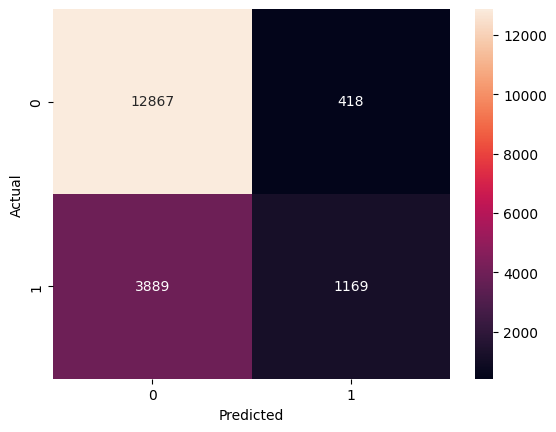

In [ ]:
# Model #1 LR raw
model=models[0]['model']
test_df_lr_raw, fpr_lr_raw, tpr_lr_raw=test_results(model_raw,X_train,y_train,X_test,y_test,cat_indices,num_indices)

In [ ]:
# Test set results - reduced set
test_df_lr_raw

,0,1,accuracy,macro avg,weighted avg
precision,0.767904,0.736610,0.765197,0.752257,0.759275
recall,0.968536,0.231119,0.765197,0.599827,0.765197
f1-score,0.856629,0.351843,0.765197,0.604236,0.717437
support,13285.000000,5058.000000,0.765197,18343.000000,18343.000000


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


======== Test Set ==========
AUC :  0.8120336033269417
Confusion Matrix:
[[16643  1326]
 [  113   261]]

Classification Report:
{'0': {'precision': 0.9932561470518023, 'recall': 0.9262062440870388, 'f1-score': 0.9585601151907848, 'support': 17969}, '1': {'precision': 0.16446124763705103, 'recall': 0.6978609625668449, 'f1-score': 0.2661907190209077, 'support': 374}, 'accuracy': 0.9215504552145233, 'macro avg': {'precision': 0.5788586973444266, 'recall': 0.8120336033269419, 'f1-score': 0.6123754171058462, 'support': 18343}, 'weighted avg': {'precision': 0.9763576412249956, 'recall': 0.9215504552145233, 'f1-score': 0.9444432229611857, 'support': 18343}}


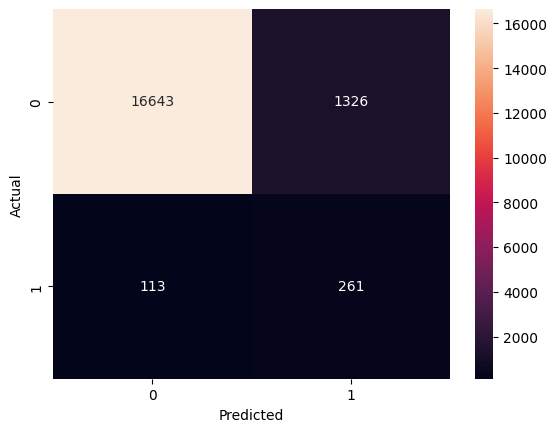

In [ ]:
# Model #1 RF raw
model_raw=models[1]['model']
test_df_rf_raw, fpr_rf_raw, tpr_rf_raw=test_results(model_raw,X_train,y_train,X_test,y_test,cat_indices,num_indices)

In [ ]:
test_df_rf_raw

,0,1,accuracy,macro avg,weighted avg
precision,0.993256,0.164461,0.92155,0.578859,0.976358
recall,0.926206,0.697861,0.92155,0.812034,0.921550
f1-score,0.958560,0.266191,0.92155,0.612375,0.944443
support,17969.000000,374.000000,0.92155,18343.000000,18343.000000


### Model 2

In [ ]:
df_model2.columns

Index(['hospital_death', 'age', 'bmi', 'elective_surgery', 'ethnicity',
       'gender', 'height', 'hospital_admit_source', 'icu_admit_source',
       'icu_id',
       ...
       'h1_pao2fio2ratio_max', 'h1_pao2fio2ratio_min', 'aids', 'cirrhosis',
       'diabetes_mellitus', 'hepatic_failure', 'immunosuppression', 'leukemia',
       'lymphoma', 'solid_tumor_with_metastasis'],
      dtype='object', length=179)

In [ ]:
X2=df_model2_alt.drop('hospital_death', axis=1).to_numpy()
y2=df_model2_alt['hospital_death'].to_numpy()
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)

In [ ]:
sum_outcome=df_model2['hospital_death'].value_counts().sum()
print(df['hospital_death'].value_counts()[0]/sum_outcome)
print(df['hospital_death'].value_counts()[1]/sum_outcome)

0.9136981671082617
0.08630183289173836


In [ ]:
categorical_columns2=get_categorical_cols(df_model2_alt)
numerical_columns2=get_numerical_cols(df_model2_alt)

cat_indices2,num_indices2=get_list_indices(df_model2_alt.drop('hospital_death', axis=1),categorical_columns2,numerical_columns2)

In [ ]:
# For model 2
print('Cross-Validation results on balanced data (SMOTE) - test and validation')
train_results2, validation_results2=build_pipeline(X_train2,y_train2,cat_indices2,num_indices2,
                                                   lr,param_grid,sample='smote')

# If all fits fail, try re-running the code
smote_model2=rename_df(train_results2,validation_results2)
smote_model2

Cross-Validation results on balanced data (SMOTE) - test and validation
Execution time: 951.0254476070404 seconds
LogisticRegression(C=3, class_weight='balanced')


,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.782763,0.778089,0.787775,0.784448
Recall,0.973938,0.252661,0.974821,0.258698
F1-score,0.867948,0.381456,0.871370,0.389075
AUC,0.613300,0.613300,0.616760,0.616760


In [ ]:
print('Cross-Validation RF results on balanced data (SMOTE) - test and validation')
train_results_rf2, validation_results_rf2=build_pipeline(X_train2,y_train2,cat_indices2,num_indices2,
                                                       rf,param_grid_rf,sample='smote')

# If all fits fail, try re-running the code
rf_smote_model2=rename_df(train_results_rf2,validation_results_rf2)
rf_smote_model2


Cross-Validation RF results on balanced data (SMOTE) - test and validation
Execution time: 9685.232311964035 seconds
RandomForestClassifier(criterion='entropy', max_depth=20, max_features='auto',
                       n_estimators=150)


,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.999698,0.992178,0.990990,0.960821
Recall,0.999262,0.996782,0.996223,0.924191
F1-score,0.999480,0.994474,0.993569,0.940082
AUC,0.998022,0.998022,0.960207,0.960207


In [ ]:
print('Cross-Validation results on raw data (no SMOTE) - test and validation')
train_results_r, validation_results_r=build_pipeline(X_train2,y_train2,cat_indices2,num_indices2,
                                                     lr,param_grid)

# If all fits fail, try re-running the code
raw_model2=rename_df(train_results_r,validation_results_r)
raw_model2

Cross-Validation results on raw data (no SMOTE) - test and validation
Execution time: 372.8975706100464 seconds
LogisticRegression(C=3, class_weight='balanced')


,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,0.766568,0.743916,0.768071,0.745418
Recall,0.969432,0.231245,0.969664,0.232773
F1-score,0.856147,0.352817,0.857171,0.354756
AUC,0.600339,0.600339,0.601218,0.601218


In [ ]:
print('Cross-Validation RF results on unbalanced data (raw) - test and validation')
train_results_rf_raw2, validation_results_rf_raw2=build_pipeline(X_train2,y_train2,cat_indices2,num_indices2,
                                                       rf,param_grid_rf)

# If all fits fail, try re-running the code
rf_raw_model2=rename_df(train_results_rf_raw2, validation_results_rf_raw2)
rf_raw_model2

Cross-Validation RF results on unbalanced data (raw) - test and validation
Execution time: 3667.6313965320587 seconds
RandomForestClassifier(max_depth=20, max_features='auto', n_estimators=50)


,Train = Class 0,Train = Class 1,Validation = Class 0,Validation = Class 1
Precision,1.000000,0.780855,1.000000,0.850830
Recall,0.979796,1.000000,0.986225,1.000000
F1-score,0.989779,0.874392,0.993037,0.915216
AUC,0.989898,0.989898,0.993113,0.993113


# Model 2: Held out test set

In [27]:
# Split the data into training and test sets (70% trainIng, 20% test)
X2 = df_model2_alt.drop('hospital_death', axis=1).to_numpy()
y2 = df_model2_alt['hospital_death'].to_numpy()
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=1)

In [26]:
# # Test models without SMOTE with best hyperparams identified by randomized search above
models2=[
    {'label': 'M2-LR-raw',
     'model': LogisticRegression(C=2, class_weight='balanced')},
    {'label': 'M2-RF-raw',
     'model': RandomForestClassifier(max_depth=20, max_features='auto', n_estimators=50)}
]

======== Test Set ==========
AUC :  0.6176990196611908
Confusion Matrix:
[[13378   381]
 [ 3378  1206]]

Classification Report:
{'0': {'precision': 0.7984005729291, 'recall': 0.9723090340867796, 'f1-score': 0.8768146813042765, 'support': 13759}, '1': {'precision': 0.7599243856332704, 'recall': 0.2630890052356021, 'f1-score': 0.39086047642197375, 'support': 4584}, 'accuracy': 0.7950716894728235, 'macro avg': {'precision': 0.7791624792811852, 'recall': 0.6176990196611909, 'f1-score': 0.6338375788631252, 'support': 18343}, 'weighted avg': {'precision': 0.7887851968966034, 'recall': 0.7950716894728235, 'f1-score': 0.7553724921759728, 'support': 18343}}


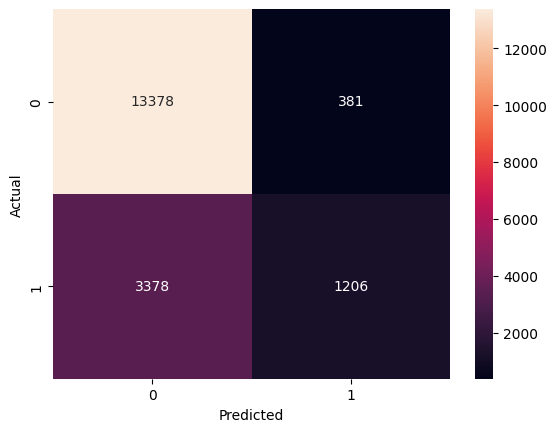

In [ ]:
# Raw reduced LR model
model_raw2 = models2[0]['model']
test_df_lr_raw2, fpr_lr_raw2, tpr_lr_raw2 = test_results(model_raw2,X_train2,y_train2,X_test2,y_test2,cat_indices2,num_indices2)


In [ ]:
test_df_lr_raw2

,0,1,accuracy,macro avg,weighted avg
precision,0.798401,0.759924,0.795072,0.779162,0.788785
recall,0.972309,0.263089,0.795072,0.617699,0.795072
f1-score,0.876815,0.390860,0.795072,0.633838,0.755372
support,13759.000000,4584.000000,0.795072,18343.000000,18343.000000


======== Test Set ==========
AUC :  0.8410243099923332
Confusion Matrix:
[[16643  1245]
 [  113   342]]

Classification Report:
{'0': {'precision': 0.9932561470518023, 'recall': 0.9304002683363148, 'f1-score': 0.9608012931532156, 'support': 17888}, '1': {'precision': 0.21550094517958412, 'recall': 0.7516483516483516, 'f1-score': 0.33496571988246815, 'support': 455}, 'accuracy': 0.9259663086736084, 'macro avg': {'precision': 0.6043785461156932, 'recall': 0.8410243099923332, 'f1-score': 0.6478835065178419, 'support': 18343}, 'weighted avg': {'precision': 0.9739638493441286, 'recall': 0.9259663086736084, 'f1-score': 0.9452773774448696, 'support': 18343}}


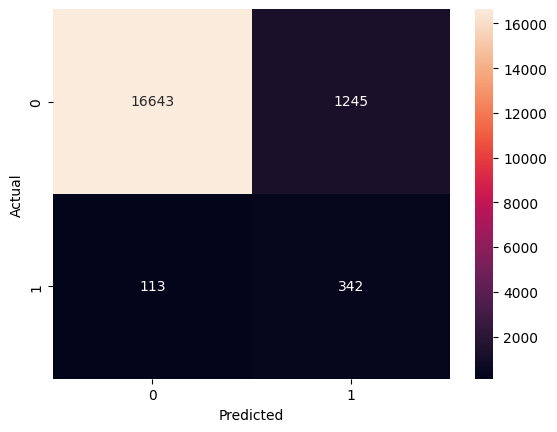

In [ ]:
# Raw reduced model
model_raw2 = models2[1]['model']
test_df_rf_raw2, fpr_rf_raw2, tpr_rf_raw2 = test_results(model_raw2,X_train2,y_train2,X_test2,y_test2,cat_indices2,num_indices2)

In [ ]:
test_df_rf_raw2

,0,1,accuracy,macro avg,weighted avg
precision,0.993256,0.215501,0.925966,0.604379,0.973964
recall,0.930400,0.751648,0.925966,0.841024,0.925966
f1-score,0.960801,0.334966,0.925966,0.647884,0.945277
support,17888.000000,455.000000,0.925966,18343.000000,18343.000000


In [ ]:
# Combining models for ROC plotting
models_all = models + models2

In [ ]:
# Combining all metric pairs from above analyses for ROC plotting
roc_metrics = [
    [fpr_lr_raw, tpr_lr_raw],
     [fpr_rf_raw, tpr_rf_raw],
      [fpr_lr_raw2, tpr_lr_raw2],
       [fpr_rf_raw2, tpr_rf_raw2]
]

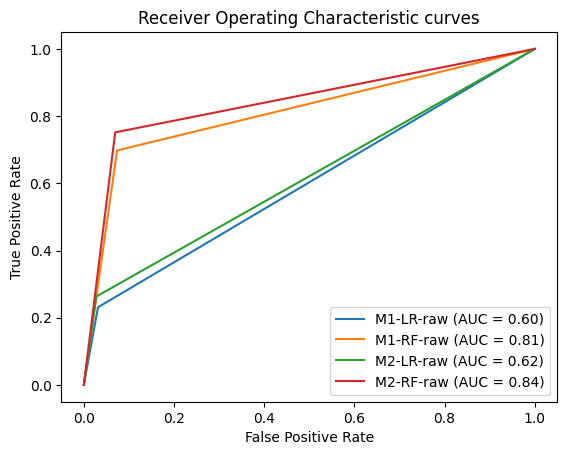

In [32]:
# Finally, we plot ROC curve for all models built up to this point
for i, pair in enumerate(roc_metrics):

  fpr = pair[0]
  tpr = pair[1]
  roc_auc = auc(fpr, tpr)
  plt.plot(fpr, tpr, label='%s (AUC = %0.2f)' % (models_all[i]['label'], roc_auc))

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic curves')
plt.legend(loc="lower right")
plt.show()